In [1]:
!pip install torch

try:
    from ultralytics import YOLO
except:
    !pip install ultralytics
    from ultralytics import YOLO

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.4/660.4 kB 7.6 MB/s eta 0:00:00


In [8]:
import torch
from PIL import Image
from IPython.display  import display
import zipfile
import os

In [3]:
torch.cuda.is_available()

True

In [4]:
# download the dataset
!curl -L "https://universe.roboflow.com/ds/rTSnBOdeq6?key=9TGU3dYlZ2" --output roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   895  100   895    0     0   2830      0 --:--:-- --:--:-- --:--:--  2832
100 18.2M  100 18.2M    0     0  9357k      0  0:00:01  0:00:01 --:--:-- 11.3M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: data.yaml               
   creating: test/
   creating: test/images/
 extracting: test/images/20231009_132947_jpg.rf.3efbc254f393279eb709d352589d53a8.jpg  
 extracting: test/images/20231009_133003_jpg.rf.79f86c266a1b904fce294d14d223e36f.jpg  
 extracting: test/images/20231009_133120_jpg.rf.255f7f397f36df359c772dd179408820.jpg  
 extracting: test/images/20231009_133211_jpg.rf.2eb1b58436b0e9025a624ff2eaf61c3a.jpg  
 extracting: test/images/20231009_133237_jpg.rf.8bae0bd7a957a5b571e3a7130f0f1ce7.jpg  
 extracting: test/images/20231009_133300_jpg.rf.693e46d5198ae3b8dfc

In [5]:
yolo = YOLO('yolov8n.pt')

100%|██████████| 6.23M/6.23M [00:00<00:00, 83.9MB/s]


In [6]:
yolo.train(data="./data.yaml", epochs=40)

Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=./data.yaml, epochs=40, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=Fa

100%|██████████| 755k/755k [00:00<00:00, 44.4MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/train/labels... 382 images, 0 backgrounds, 0 corrupt: 100%|██████████| 382/382 [00:00<00:00, 1785.75it/s]

train: New cache created: /content/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/valid/labels... 37 images, 1 backgrounds, 0 corrupt: 100%|██████████| 37/37 [00:00<00:00, 1313.49it/s]

val: New cache created: /content/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      3.33G      1.606      3.557      1.107        429        640: 100%|██████████| 24/24 [00:22<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.07s/it]

                   all         37       1078     0.0615      0.597      0.177      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      3.05G      1.557      2.231      1.034        413        640: 100%|██████████| 24/24 [00:12<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]


                   all         37       1078      0.291      0.322      0.283      0.153

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40         3G      1.458      1.788      1.022        620        640: 100%|██████████| 24/24 [00:10<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         37       1078      0.232      0.405      0.286      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      3.26G      1.413      1.628      1.008        575        640: 100%|██████████| 24/24 [00:10<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         37       1078      0.272        0.5      0.347      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      3.49G      1.405      1.514       1.01        773        640: 100%|██████████| 24/24 [00:09<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.88it/s]

                   all         37       1078      0.287      0.384      0.305      0.161



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      3.36G      1.407      1.483      1.023        292        640: 100%|██████████| 24/24 [00:10<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]


                   all         37       1078      0.387      0.499       0.42      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      3.03G      1.358      1.399      1.011        561        640: 100%|██████████| 24/24 [00:11<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         37       1078      0.484      0.518      0.502      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      2.86G      1.307      1.329     0.9951        438        640: 100%|██████████| 24/24 [00:11<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]


                   all         37       1078       0.51      0.515      0.531      0.341

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40      3.12G      1.327      1.282     0.9973        587        640: 100%|██████████| 24/24 [00:10<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         37       1078       0.53      0.515      0.526      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40       3.6G      1.315      1.234     0.9887        694        640: 100%|██████████| 24/24 [00:08<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.64it/s]

                   all         37       1078      0.555      0.588      0.577      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      3.36G      1.299      1.175     0.9883        585        640: 100%|██████████| 24/24 [00:09<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.00it/s]

                   all         37       1078      0.619      0.567      0.622      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40       3.3G      1.291      1.175     0.9976        603        640: 100%|██████████| 24/24 [00:11<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         37       1078      0.666       0.56       0.62      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      3.27G      1.264      1.119     0.9808        457        640: 100%|██████████| 24/24 [00:11<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         37       1078      0.638      0.603      0.656      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      3.18G      1.279      1.101     0.9934        426        640: 100%|██████████| 24/24 [00:11<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]

                   all         37       1078      0.727       0.64      0.701       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      3.38G      1.227      1.061     0.9814        437        640: 100%|██████████| 24/24 [00:09<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.50it/s]

                   all         37       1078      0.664      0.606      0.646        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40       3.4G      1.246      1.049     0.9816        488        640: 100%|██████████| 24/24 [00:09<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         37       1078      0.633      0.602      0.642       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40       3.2G      1.211      1.034     0.9738        352        640: 100%|██████████| 24/24 [00:11<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]

                   all         37       1078      0.735      0.618      0.703      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      2.94G      1.225      1.009     0.9792        614        640: 100%|██████████| 24/24 [00:10<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]


                   all         37       1078      0.781      0.626       0.72      0.466

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      2.97G       1.22     0.9739     0.9718        465        640: 100%|██████████| 24/24 [00:11<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         37       1078      0.749      0.697      0.734      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40       3.2G      1.199     0.9462     0.9648        516        640: 100%|██████████| 24/24 [00:10<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.57it/s]

                   all         37       1078      0.786      0.668      0.746      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      3.65G      1.193     0.9196     0.9669        468        640: 100%|██████████| 24/24 [00:09<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.80it/s]

                   all         37       1078      0.819      0.668      0.756       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      3.89G      1.193     0.9159     0.9595        587        640: 100%|██████████| 24/24 [00:10<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all         37       1078      0.812      0.646      0.731      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      3.14G      1.216     0.8991     0.9758        547        640: 100%|██████████| 24/24 [00:11<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]


                   all         37       1078      0.797      0.677      0.759      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      3.41G      1.194     0.8907     0.9702        439        640: 100%|██████████| 24/24 [00:11<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.57it/s]

                   all         37       1078      0.824      0.655      0.758      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      3.18G      1.142     0.8562     0.9525        655        640: 100%|██████████| 24/24 [00:11<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         37       1078      0.835      0.692      0.769      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      3.23G       1.17     0.8575     0.9596        583        640: 100%|██████████| 24/24 [00:09<00:00,  2.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         37       1078      0.772      0.689      0.761        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      3.07G      1.145     0.8314      0.959        503        640: 100%|██████████| 24/24 [00:09<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]

                   all         37       1078      0.782      0.729      0.776      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40         3G      1.149     0.8317     0.9483        674        640: 100%|██████████| 24/24 [00:11<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.46it/s]

                   all         37       1078      0.755      0.708      0.757       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      3.14G      1.134     0.8282     0.9527        362        640: 100%|██████████| 24/24 [00:11<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.54it/s]

                   all         37       1078      0.835      0.708      0.787      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      3.61G      1.142     0.7939     0.9521        656        640: 100%|██████████| 24/24 [00:11<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         37       1078       0.81      0.716      0.772      0.475


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      3.14G      1.135     0.8032     0.9573        352        640: 100%|██████████| 24/24 [00:17<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         37       1078      0.792      0.728      0.768      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40       2.8G      1.146     0.7749      0.962        324        640: 100%|██████████| 24/24 [00:10<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.70it/s]


                   all         37       1078      0.758       0.72       0.75      0.465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      3.17G      1.144      0.773     0.9535        335        640: 100%|██████████| 24/24 [00:08<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         37       1078      0.778      0.722       0.77      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      2.73G       1.14     0.7434     0.9612        409        640: 100%|██████████| 24/24 [00:07<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         37       1078      0.827      0.708      0.777      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      2.85G      1.126     0.7484     0.9553        370        640: 100%|██████████| 24/24 [00:09<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         37       1078        0.8      0.735      0.781      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      3.24G      1.111     0.7222     0.9518        385        640: 100%|██████████| 24/24 [00:10<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         37       1078      0.832      0.724      0.786      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      2.96G      1.112     0.7191     0.9517        407        640: 100%|██████████| 24/24 [00:07<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         37       1078       0.83      0.734      0.786      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      3.37G      1.094     0.7102     0.9525        398        640: 100%|██████████| 24/24 [00:09<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.83it/s]

                   all         37       1078      0.852      0.721      0.795      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      2.68G      1.099     0.7155     0.9484        356        640: 100%|██████████| 24/24 [00:09<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.75it/s]

                   all         37       1078      0.817      0.733      0.791      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      3.16G      1.088     0.7024     0.9456        390        640: 100%|██████████| 24/24 [00:07<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.49it/s]

                   all         37       1078      0.829      0.728      0.796      0.522



40 epochs completed in 0.143 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.0.226 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.99it/s]


                   all         37       1078      0.831      0.713      0.787      0.523
                 Crimp         37        377      0.803      0.745      0.792      0.502
                   Jug         37        284      0.907       0.82      0.894      0.632
                 Pinch         37        145      0.873      0.521        0.7      0.375
                Pocket         37         46      0.878      0.739      0.775      0.521
                Sloper         37        226      0.693      0.738      0.773      0.584
Speed: 0.4ms preprocess, 3.1ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a3aaff3e440>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        


image 1/1 /content/test/images/20231016_174531_jpg.rf.9d1c944ca270dc8c1cd248aa0b2befaa.jpg: 640x640 12 Crimps, 5 Jugs, 3 Pinchs, 6 Slopers, 11.1ms
Speed: 1.7ms preprocess, 11.1ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


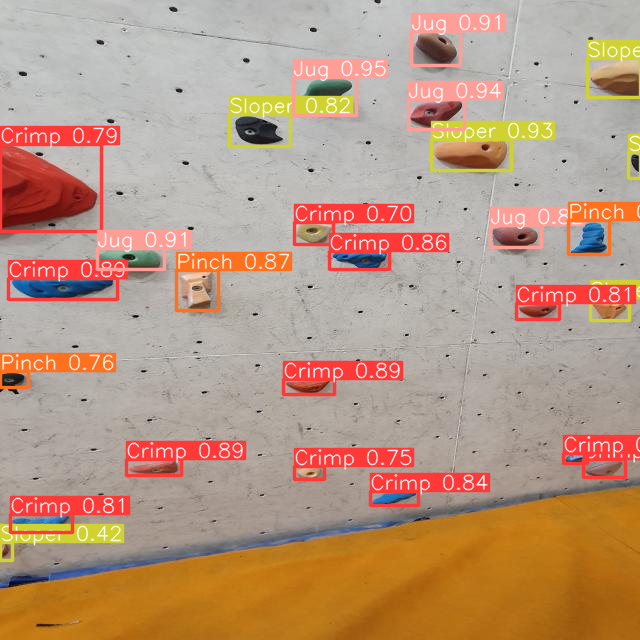

In [9]:
def run_yolo(yolo, image_url, conf=0.25, iou=0.7):
    results = yolo(image_url, conf=conf, iou=iou)
    res = results[0].plot()[:, :, [2,1,0]]
    return Image.fromarray(res)

yolo = YOLO('./runs/detect/train/weights/best.pt')

image_url = './test/images/20231016_174531_jpg.rf.9d1c944ca270dc8c1cd248aa0b2befaa.jpg'

run_yolo(yolo, image_url)

In [39]:
#manually downloaded the zipfile from roboflow


zip_file_path = 'yolo_bound.zip'


extracted_dir = 'bound_data'

os.makedirs(extracted_dir, exist_ok=True)

In [40]:
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir)

In [41]:
path="./bound_data/test/images"


image 1/1 /content/bound_data/test/images/IMG_2727_jpg.rf.06271d1bcc0da6e4e5ca27aeac72a51f.jpg: 480x640 6 Crimps, 3 Jugs, 44 Slopers, 8.2ms
Speed: 3.6ms preprocess, 8.2ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


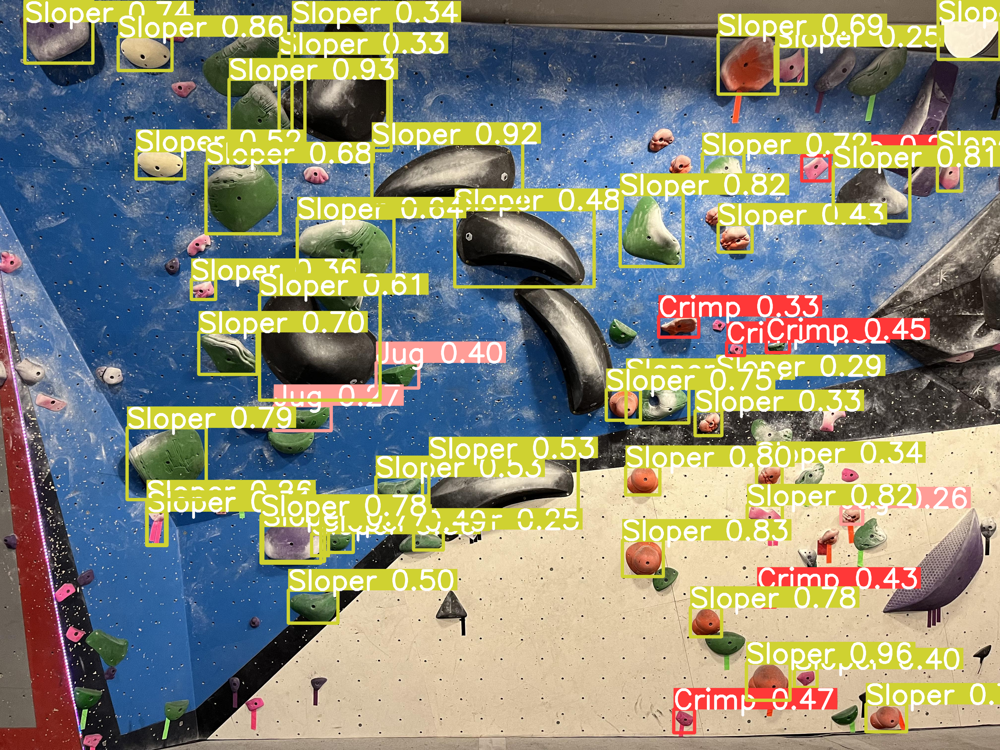

In [42]:
for item in os.listdir(path):
    picture = path + "/" + item
    results = yolo(picture, conf=0.25, iou=0.7)
    res = results[0].plot()[:, :, [2,1,0]]
    display(Image.fromarray(res))
    break

In [31]:
# %load_ext tensorboard
# %tensorboard --logdir runs

Evaluating model performance on out of sample data

In [43]:
class BoundingBox:
    def __init__(self, left, top, right, bottom):
        self.left = left
        self.top = top
        self.right = right
        self.bottom = bottom

In [44]:
def convert_gt_to_xyxy(gt_box):
    x1 = min(gt_box[0], gt_box[2], gt_box[4], gt_box[6])
    y1 = min(gt_box[1], gt_box[3], gt_box[5], gt_box[7])
    x2 = max(gt_box[0], gt_box[2], gt_box[4], gt_box[6])
    y2 = max(gt_box[1], gt_box[3], gt_box[5], gt_box[7])
    return x1, y1, x2, y2

In [45]:
def calculate_iou(box1, box2):
    box2=convert_gt_to_xyxy(box2)
    box2 = BoundingBox(box2[0], box2[1], box2[2], box2[3])
    box1 = BoundingBox(box1[0], box1[1], box1[2], box1[3])


    intersection_width = min(box1.right, box2.right) - max(box1.left, box2.left)
    intersection_height = min(box1.bottom, box2.bottom) - max(box1.top, box2.top)

    if intersection_width <= 0 or intersection_height <= 0:
        return 0

    intersection_area = intersection_width * intersection_height

    box1_area = (box1.right - box1.left) * (box1.bottom - box1.top)
    box2_area = (box2.right - box2.left) * (box2.bottom - box2.top)

    union_area = box1_area + box2_area - intersection_area

    iou = intersection_area / union_area
    return iou

In [46]:
def convert_to_truth(text_input):
  lines = text_input.split('\n')

  bounding_boxes_and_labels = []

  for line in lines:
      if line.strip():
          parts = line.split()
          box = tuple(map(float, parts[:8]))
          label = parts[8]
          confidence = float(parts[9])
          bounding_boxes_and_labels.append({"box": box, "label": label, "confidence": confidence})
  return bounding_boxes_and_labels

In [47]:
def calculate_precision_recall(ground_truth_data, results, iou_threshold=0.5):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    results_boxes = results[0].boxes.data.tolist()
    results_labels = [results[0].names[int(each_score[-1])] for each_score in results_boxes]

    for result in zip(results_boxes, results_labels):
        pred_box, pred_label = result
        pred_box = pred_box[:4]

        match_found = False

        for gt_data in ground_truth_data:
            gt_box = gt_data["box"]
            gt_label = gt_data["label"]

            if pred_label == gt_label and calculate_iou(pred_box, gt_box) > iou_threshold:
                match_found = True
                break

        if match_found:
            true_positives += 1
        else:
            false_positives += 1

    false_negatives = len(ground_truth_data) - true_positives

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0

    return precision, recall

In [48]:
img_iterator, img_path = os.listdir("/content/bound_data/test/images"), "/content/bound_data/test/images"
label_path = "/content/bound_data/test/labelTxt"

total_precision, total_recall = 0, 0
for i in range(len(img_iterator)):

  label=label_path+"/"+img_iterator[i][:-3]+"txt"

  with open(label) as f:
    og_labels=f.read()

  ground_truth=convert_to_truth(og_labels)


  image_path=img_path+"/"+img_iterator[i]

  results = yolo(image_path, conf=0.25, iou=0.7)

  total_precision+=calculate_precision_recall(ground_truth, results)[0]
  total_recall+=calculate_precision_recall(ground_truth, results)[1]


image 1/1 /content/bound_data/test/images/IMG_2727_jpg.rf.06271d1bcc0da6e4e5ca27aeac72a51f.jpg: 480x640 6 Crimps, 3 Jugs, 44 Slopers, 8.0ms
Speed: 3.5ms preprocess, 8.0ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/bound_data/test/images/IMG_2756_jpg.rf.c5b63de5296810740a802edeaab000a6.jpg: 480x640 11 Crimps, 5 Jugs, 3 Pockets, 34 Slopers, 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/bound_data/test/images/IMG_2755_jpg.rf.2d4a95b90b3c4193731cfdd186010232.jpg: 480x640 3 Crimps, 2 Jugs, 1 Pocket, 23 Slopers, 7.9ms
Speed: 3.1ms preprocess, 7.9ms inference, 2.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/bound_data/test/images/IMG_2776_jpg.rf.52099bbfbed90d64a8c2e0d98beff34f.jpg: 480x640 62 Pockets, 111 Slopers, 7.7ms
Speed: 3.1ms preprocess, 7.7ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/bound_data/test

In [49]:
f"The precision is: {total_precision/3}, the recall is: {total_recall/3} "

'The precision is: 0.4436150679581113, the recall is: 0.480480506091235 '